In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as wife
# from streamlit import sidebar as sbar
# from streamlit.report_thread import get_report_ctx
from sqlalchemy import create_engine
import psycopg2

from decouple import config


import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from yahoo_fin import stock_info as si
from collections import deque

import os
import numpy as np
import pandas as pd
import random


In [4]:
df_to_shift = pd.DataFrame(np.array([[1,2,3,4,5],['a','b','c','d','e',]]).T, columns=['nums', 'alpha'])

In [6]:
df_to_shift.shift(-2)

,nums,alpha
0,3,c
1,4,d
2,5,e
3,NaN,NaN
4,NaN,NaN


In [16]:
df_to_shift[['nums', 'alpha']].values

array([['1', 'a'],
       ['2', 'b'],
       ['3', 'c'],
       ['4', 'd'],
       ['5', 'e']], dtype=object)

In [12]:
type(df_to_shift['nums'])

pandas.core.series.Series

In [2]:
def write_state(column,value,engine,session_id):
    engine.execute("UPDATE %s SET %s='%s'" % (session_id,column,value))

def insert_state(col, value, engine ,session_id):
    engine.execute("INSERT %s SET %s='%s'" % (session_id,column,value))

def write_state_df(df,engine,session_id):
    df.to_sql('%s' % (session_id),engine,index=False,if_exists='replace',chunksize=1000)

def read_state(column,engine,session_id):
    state_var = engine.execute("SELECT %s FROM %s" % (column,session_id))
    state_var = state_var.first()[0]
    return state_var

def read_state_df(engine,session_id):
    try:
        df = pd.read_sql_table(session_id,con=engine)
    except:
        df = pd.DataFrame([])
    return df

In [5]:
#Creating PostgreSQL client
PGUSER = config("DEVPOSTGRESUSER")
PGPASS = config("DEVPOSTGRESPASSWORD")
engine = create_engine('postgresql://%s:%s@localhost:5432/postgres' % (PGUSER, PGPASS))

#Getting session ID
session_id = "_id_temp_session_999"#get_session_id()
ss_id = "_id_stock_selection"


In [6]:
#Creating session state tables
# !!!! https://help.ubuntu.com/community/PostgreSQL !!!
# finding adminpack https://askubuntu.com/questions/184577/postgresql-9-1-adminpack-install
# https://www.postgresqltutorial.com/postgresql-reset-password/
# https://www.psycopg.org/docs/install.html
# https://towardsdatascience.com/implementing-a-stateful-architecture-with-streamlit-58e52448efa1
# https://vim.fandom.com/wiki/Search_and_replace
# https://www.pgadmin.org/download/pgadmin-4-apt/
engine.execute("CREATE TABLE IF NOT EXISTS %s (size text)" % (session_id))
engine.execute("CREATE TABLE IF NOT EXISTS %s (id INT, ticker TEXT, allocation FLOAT)" % (ss_id))
engine.execute("CREATE UNIQUE INDEX id_idx ON %s (id)" % (ss_id))
len_table =  engine.execute("SELECT COUNT(*) FROM %s" % (session_id));
len_table = len_table.first()[0]
if len_table == 0:
    engine.execute("INSERT INTO %s (size) VALUES ('1')" % (session_id));
    

In [39]:
len_table

1

In [40]:
write_state("ticker", "GOOGL", engine, ss_id)

In [11]:
df = read_state_df(engine, ss_id)


In [12]:
df

""


In [53]:
df = df.append({"ticker":"GOOGLE","allocation":10.00}, ignore_index=True)
df = df.append({"ticker":"AAPL",  "allocation":90.00}, ignore_index=True)
df

,id,ticker,allocation
0,NaN,GOOGLE,10.0
1,NaN,AAPL,90.0
2,NaN,GOOGLE,10.0
3,NaN,AAPL,90.0


In [54]:
write_state_df(df, engine, ss_id)

In [10]:
engine.execute("DROP TABLE IF EXISTS {} ".format(ss_id))

In [17]:
write_state("size", 0, engine, session_id)

In [19]:
for i in engine.execute("SELECT * FROM %s" % session_id):
    print(i)

('0',)


In [4]:
google = wife.Ticker("GOOGL")

In [7]:
google.info

{'zip': '94043',
 'sector': 'Communication Services',
 'fullTimeEmployees': 135301,
 'longBusinessSummary': 'Alphabet Inc. provides online advertising services in the United States, Europe, the Middle East, Africa, the Asia-Pacific, Canada, and Latin America. The company offers performance and brand advertising services. It operates through Google Services, Google Cloud, and Other Bets segments. The Google Services segment provides products and services, such as ads, Android, Chrome, hardware, Google Maps, Google Play, Search, and YouTube, as well as technical infrastructure; and digital content. The Google Cloud segment offers infrastructure and data analytics platforms, collaboration tools, and other services for enterprise customers. The Other Bets segment sells internet and TV services, as well as licensing and research and development services. The company was founded in 1998 and is headquartered in Mountain View, California.',
 'city': 'Mountain View',
 'phone': '650-253-0000',
 

In [2]:
def get_data():
    return pd.read_csv("__data_file/C_hist_data.csv")
data = get_data()

In [3]:
time_cprice_data = data[["Date","Close"]].set_index("Date")
charted_data = time_cprice_data#[0:1]
# charted_data.set_index("Date")

In [4]:
data["Close"]

0         7.927145
1         7.952467
2         7.901817
3         7.851166
4         7.876490
           ...    
11125    63.630001
11126    64.120003
11127    64.760002
11128    63.480000
11129    65.779999
Name: Close, Length: 11130, dtype: float64

In [62]:
time_cprice_data.iloc[2:2, :]

,Close
Date,


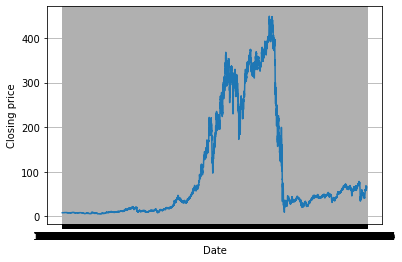

In [18]:
fig, ax = plt.subplots()
ax.plot(charted_data.Date, charted_data.Close)
ax.set(xlabel="Date", ylabel="Closing price")
ax.grid()

plt.show()

In [17]:
"""
Credit: https://www.thepythoncode.com/article/stock-price-prediction-in-python-using-tensorflow-2-and-keras
"""
def shuffle_in_unison(a, b):
    #shuffle two arrays in the same way
    state = np.random.get_state()
    np.random.shuffle(a)
    np.random.set_state(state)
    np.random.shuffle(b)

def load_data(ticker, n_steps=50,
 scale=True, shuffle=True,
lookup_step=1, split_by_date=True,
test_size=0.2, feature_columns=['adjclose', 'volume', "open", "high", "low"]):
    """
    Loads data from Yahoo Finance source, as well as scaling, shuffling, normalizing and splitting.
    Params:
        ticker (str/pd.DataFrame): the ticker you want to load, examples include AAPL, TESL, etc.
        n_steps (int): the historical sequence length (i.e window size) used to predict, default is 50
        scale (bool): whether to scale prices from 0 to 1, default is True
        shuffle (bool): whether to shuffle the dataset (both training & testing), default is True
        lookup_step (int): the future lookup step to predict, default is 1 (e.g next day)
        split_by_date (bool): whether we split the dataset into training/testing by date, setting it 
            to False will split datasets in a random way
        test_size (float): ratio for test data, default is 0.2 (20% testing data)
        feature_columns (list): the list of features to use to feed into the model, default is everything grabbed from yahoo_fin
    """

    if isinstance(ticker, str):
        # load it from yahoo_fin library
        df = si.get_data(ticker)
    elif isinstance(ticker, pd.DataFrame):
        # already loaded, use it directly
        df = ticker
    else:
        raise TypeError("ticker can be either a str or a `pd.DataFrame` instances")
    # this will contain all the elements we want to return from this function
    result = {}
    # we will also return the original dataframe itself
    result['df'] = df.copy()
    # make sure that the passed feature_columns exist in the dataframe
    for col in feature_columns:
        assert col in df.columns, f"'{col}' does not exist in the dataframe."
    # add date as a column
    if "date" not in df.columns:
        df["date"] = df.index
    if scale:
        column_scaler = {}
        # scale the data (prices) from 0 to 1
        for column in feature_columns:
            scaler = preprocessing.MinMaxScaler()
            df[column] = scaler.fit_transform(np.expand_dims(df[column].values, axis=1))
            column_scaler[column] = scaler
        # add the MinMaxScaler instances to the result returned
        result["column_scaler"] = column_scaler
    # add the target column (label) by shifting by `lookup_step`
    df['future'] = df['adjclose'].shift(-lookup_step)
    # last `lookup_step` rows contains NaN in future column
    # get them before dropping NaNs
    last_sequence = np.array(df[feature_columns].tail(lookup_step))
    # drop NaNs
    df.dropna(inplace=True)
    sequence_data = []
    sequences = deque(maxlen=n_steps)
    for entry, target in zip(df[feature_columns + ["date"]].values, df['future'].values):
        sequences.append(entry)
        if len(sequences) == n_steps:
            sequence_data.append([np.array(sequences), target])
    # get the last sequence by appending the last `n_step` sequence with `lookup_step` sequence
    # for instance, if n_steps=50 and lookup_step=10, last_sequence should be of 60 (that is 50+10) length
    # this last_sequence will be used to predict future stock prices that are not available in the dataset
    last_sequence = list([s[:len(feature_columns)] for s in sequences]) + list(last_sequence)
    last_sequence = np.array(last_sequence).astype(np.float32)
    # add to result
    result['last_sequence'] = last_sequence
    # construct the X's and y's
    X, y = [], []
    for seq, target in sequence_data:
        X.append(seq)
        y.append(target)
    # convert to numpy arrays
    X = np.array(X)
    y = np.array(y)
    if split_by_date:
        # split the dataset into training & testing sets by date (not randomly splitting)
        train_samples = int((1 - test_size) * len(X))
        result["X_train"] = X[:train_samples]
        result["y_train"] = y[:train_samples]
        result["X_test"]  = X[train_samples:]
        result["y_test"]  = y[train_samples:]
        if shuffle:
            # shuffle the datasets for training (if shuffle parameter is set)
            shuffle_in_unison(result["X_train"], result["y_train"])
            shuffle_in_unison(result["X_test"], result["y_test"])
    else:    
        # split the dataset randomly
        result["X_train"], result["X_test"], result["y_train"], result["y_test"] = train_test_split(X, y, 
                                                                                test_size=test_size, shuffle=shuffle)
    # get the list of test set dates
    dates = result["X_test"][:, -1, -1]
    # retrieve test features from the original dataframe
    result["test_df"] = result["df"].loc[dates]
    # remove duplicated dates in the testing dataframe
    result["test_df"] = result["test_df"][~result["test_df"].index.duplicated(keep='first')]
    # remove dates from the training/testing sets & convert to float32
    result["X_train"] = result["X_train"][:, :, :len(feature_columns)].astype(np.float32)
    result["X_test"] = result["X_test"][:, :, :len(feature_columns)].astype(np.float32)
    return result

In [28]:
data['adjclose'].shift(-10)

KeyError: 'adjclose'

In [19]:
tsla = load_data("tsla")

In [21]:
tsla["last_sequence"]

array([[0.9110497 , 0.11714378, 0.94624794, 0.938043  , 0.9175919 ],
       [0.918823  , 0.06915553, 0.9111188 , 0.92138886, 0.9195606 ],
       [0.92389166, 0.07621074, 0.8985309 , 0.90739894, 0.90067977],
       [0.9012762 , 0.06316904, 0.917379  , 0.91149   , 0.9088653 ],
       [0.9034696 , 0.0835379 , 0.87356895, 0.88790226, 0.87383205],
       [0.89123   , 0.05710133, 0.8756069 , 0.8821613 , 0.89024925],
       [0.8843203 , 0.06039365, 0.89148253, 0.88450223, 0.8915156 ],
       [0.80840516, 0.12060841, 0.85504735, 0.8529664 , 0.81418467],
       [0.79060835, 0.21708015, 0.74187976, 0.79177856, 0.7091886 ],
       [0.83968043, 0.11895535, 0.79786116, 0.8267701 , 0.7957297 ],
       [0.7717204 , 0.12637688, 0.81396204, 0.8180864 , 0.7685712 ],
       [0.7640835 , 0.13316837, 0.78451884, 0.7840758 , 0.75582665],
       [0.81287146, 0.08728566, 0.7733834 , 0.797787  , 0.7852301 ],
       [0.7765163 , 0.07609203, 0.805101  , 0.80013907, 0.7851725 ],
       [0.73874056, 0.09738689, 0.

In [5]:
def create_model(sequence_length, n_features, units=256, cell=LSTM, n_layers=2, dropout=0.3,
                loss="mean_absolute_error", optimizer="rmsprop", bidirectional=False):
    model = Sequential()
    for i in range(n_layers):
        if i == 0:
            # first layer
            if bidirectional:
                model.add(Bidirectional(cell(units, return_sequences=True), batch_input_shape=(None, sequence_length, n_features)))
            else:
                model.add(cell(units, return_sequences=True, batch_input_shape=(None, sequence_length, n_features)))
        elif i == n_layers - 1:
            # last layer
            if bidirectional:
                model.add(Bidirectional(cell(units, return_sequences=False)))
            else:
                model.add(cell(units, return_sequences=False))
        else:
            # hidden layers
            if bidirectional:
                model.add(Bidirectional(cell(units, return_sequences=True)))
            else:
                model.add(cell(units, return_sequences=True))
        # add dropout after each layer
        model.add(Dropout(dropout))
    model.add(Dense(1, activation="linear"))
    model.compile(loss=loss, metrics=["mean_absolute_error"], optimizer=optimizer)
    return model

In [6]:
import os
import time
from tensorflow.keras.layers import LSTM

# Window size or the sequence length
N_STEPS = 50
# Lookup step, 1 is the next day
LOOKUP_STEP = 15 # days
# whether to scale feature columns & output price as well
SCALE = True
scale_str = f"sc-{int(SCALE)}"
# whether to shuffle the dataset
SHUFFLE = True
shuffle_str = f"sh-{int(SHUFFLE)}"
# whether to split the training/testing set by date
SPLIT_BY_DATE = False
split_by_date_str = f"sbd-{int(SPLIT_BY_DATE)}"
# test ratio size, 0.2 is 20%
TEST_SIZE = 0.2
# features to use
FEATURE_COLUMNS = ["adjclose", "volume", "open", "high", "low"]
# date now
date_now = time.strftime("%Y-%m-%d")
### model parameters
N_LAYERS = 2
# LSTM cell
CELL = LSTM
# 256 LSTM neurons
UNITS = 256
# 40% dropout
DROPOUT = 0.4
# whether to use bidirectional RNNs
BIDIRECTIONAL = False
### training parameters
# mean absolute error loss
# LOSS = "mae"
# huber loss
LOSS = "huber_loss"
OPTIMIZER = "adam"
BATCH_SIZE = 64
EPOCHS = 500
# Amazon stock market
ticker = "AMZN"
ticker_data_filename = os.path.join("data", f"{ticker}_{date_now}.csv")
# model name to save, making it as unique as possible based on parameters
model_name = f"{date_now}_{ticker}-{shuffle_str}-{scale_str}-{split_by_date_str}-\
{LOSS}-{OPTIMIZER}-{CELL.__name__}-seq-{N_STEPS}-step-{LOOKUP_STEP}-layers-{N_LAYERS}-units-{UNITS}"
if BIDIRECTIONAL:
    model_name += "-b"

if not os.path.isdir("results"):
    os.mkdir("results")
if not os.path.isdir("logs"):
    os.mkdir("logs")
if not os.path.isdir("data"):
    os.mkdir("data")

In [7]:
# load the data
data = load_data(ticker, N_STEPS, scale=SCALE, split_by_date=SPLIT_BY_DATE, 
                shuffle=SHUFFLE, lookup_step=LOOKUP_STEP, test_size=TEST_SIZE, 
                feature_columns=FEATURE_COLUMNS)
# save the dataframe
data["df"].to_csv(ticker_data_filename)
# construct the model
model = create_model(N_STEPS, len(FEATURE_COLUMNS), loss=LOSS, units=UNITS, cell=CELL, n_layers=N_LAYERS,
                    dropout=DROPOUT, optimizer=OPTIMIZER, bidirectional=BIDIRECTIONAL)
# some tensorflow callbacks
checkpointer = ModelCheckpoint(os.path.join("results", model_name + ".h5"), save_weights_only=True, save_best_only=True, verbose=1)
tensorboard = TensorBoard(log_dir=os.path.join("logs", model_name))
# train the model and save the weights whenever we see 
# a new optimal model using ModelCheckpoint
history = model.fit(data["X_train"], data["y_train"],
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS,
                    validation_data=(data["X_test"], data["y_test"]),
                    callbacks=[checkpointer, tensorboard],
                    verbose=1)

not improve from 0.00007
Epoch 416/500
75/75 [==============================] - 27s 353ms/step - loss: 1.9047e-04 - mean_absolute_error: 0.0109 - val_loss: 9.3363e-05 - val_mean_absolute_error: 0.0078

Epoch 00416: val_loss did not improve from 0.00007
Epoch 417/500
75/75 [==============================] - 25s 332ms/step - loss: 1.8970e-04 - mean_absolute_error: 0.0110 - val_loss: 8.4965e-05 - val_mean_absolute_error: 0.0065

Epoch 00417: val_loss did not improve from 0.00007
Epoch 418/500
75/75 [==============================] - 28s 374ms/step - loss: 2.0512e-04 - mean_absolute_error: 0.0115 - val_loss: 7.5569e-05 - val_mean_absolute_error: 0.0063

Epoch 00418: val_loss did not improve from 0.00007
Epoch 419/500
75/75 [==============================] - 22s 296ms/step - loss: 1.7327e-04 - mean_absolute_error: 0.0106 - val_loss: 8.6804e-05 - val_mean_absolute_error: 0.0060

Epoch 00419: val_loss did not improve from 0.00007
Epoch 420/500
75/75 [==============================] - 24s 326m

In [34]:
data["df"]["new_c"] = data["df"]['adjclose'].shift(-10) 


In [35]:
data["df"]


,open,high,low,close,adjclose,volume,ticker,new_c
1997-05-15,2.437500,2.500000,1.927083,1.958333,1.958333,72156000,AMZN,1.500000
1997-05-16,1.968750,1.979167,1.708333,1.729167,1.729167,14700000,AMZN,1.510417
1997-05-19,1.760417,1.770833,1.625000,1.708333,1.708333,6106800,AMZN,1.479167
1997-05-20,1.729167,1.750000,1.635417,1.635417,1.635417,5467200,AMZN,1.416667
1997-05-21,1.635417,1.645833,1.375000,1.427083,1.427083,18853200,AMZN,1.541667
...,...,...,...,...,...,...,...,...
2021-04-12,3355.209961,3395.040039,3351.149902,3379.389893,3379.389893,3281800,AMZN,NaN
2021-04-13,3400.850098,3432.000000,3395.629883,3400.000000,3400.000000,3315800,AMZN,NaN
2021-04-14,3404.040039,3404.129883,3326.000000,3333.000000,3333.000000,3145200,AMZN,NaN
2021-04-15,3371.000000,3397.000000,3352.000000,3379.090088,3379.090088,3233600,AMZN,NaN


In [27]:
data["df"]["adjclose"].values

array([1.95833302e+00, 1.72916698e+00, 1.70833302e+00, ...,
       3.33300000e+03, 3.37909009e+03, 3.39943994e+03])

In [8]:
import matplotlib.pyplot as plt

def plot_graph(test_df):
    """
    This function plots true close price along with predicted close price
    with blue and red colors respectively
    """
    plt.plot(test_df[f'true_adjclose_{LOOKUP_STEP}'], c='b')
    plt.plot(test_df[f'adjclose_{LOOKUP_STEP}'], c='r')
    plt.xlabel("Days")
    plt.ylabel("Price")
    plt.legend(["Actual Price", "Predicted Price"])
    plt.show()

In [9]:
def get_final_df(model, data):
    """
    This function takes the `model` and `data` dict to 
    construct a final dataframe that includes the features along 
    with true and predicted prices of the testing dataset
    """
    # if predicted future price is higher than the current, 
    # then calculate the true future price minus the current price, to get the buy profit
    buy_profit  = lambda current, true_future, pred_future: true_future - current if pred_future > current else 0
    # if the predicted future price is lower than the current price,
    # then subtract the true future price from the current price
    sell_profit = lambda current, true_future, pred_future: current - true_future if pred_future < current else 0
    X_test = data["X_test"]
    y_test = data["y_test"]
    # perform prediction and get prices
    y_pred = model.predict(X_test)
    if SCALE:
        y_test = np.squeeze(data["column_scaler"]["adjclose"].inverse_transform(np.expand_dims(y_test, axis=0)))
        y_pred = np.squeeze(data["column_scaler"]["adjclose"].inverse_transform(y_pred))
    test_df = data["test_df"]
    # add predicted future prices to the dataframe
    test_df[f"adjclose_{LOOKUP_STEP}"] = y_pred
    # add true future prices to the dataframe
    test_df[f"true_adjclose_{LOOKUP_STEP}"] = y_test
    # sort the dataframe by date
    test_df.sort_index(inplace=True)
    final_df = test_df
    # add the buy profit column
    final_df["buy_profit"] = list(map(buy_profit, 
                                    final_df["adjclose"], 
                                    final_df[f"adjclose_{LOOKUP_STEP}"], 
                                    final_df[f"true_adjclose_{LOOKUP_STEP}"])
                                    # since we don't have profit for last sequence, add 0's
                                    )
    # add the sell profit column
    final_df["sell_profit"] = list(map(sell_profit, 
                                    final_df["adjclose"], 
                                    final_df[f"adjclose_{LOOKUP_STEP}"], 
                                    final_df[f"true_adjclose_{LOOKUP_STEP}"])
                                    # since we don't have profit for last sequence, add 0's
                                    )
    return final_df

In [10]:
def predict(model, data):
    # retrieve the last sequence from data
    last_sequence = data["last_sequence"][-N_STEPS:]
    # expand dimension
    last_sequence = np.expand_dims(last_sequence, axis=0)
    # get the prediction (scaled from 0 to 1)
    prediction = model.predict(last_sequence)
    # get the price (by inverting the scaling)
    if SCALE:
        predicted_price = data["column_scaler"]["adjclose"].inverse_transform(prediction)[0][0]
    else:
        predicted_price = prediction[0][0]
    return predicted_price

In [11]:
# Load saved model weights
# load optimal model weights from results folder
model_path = os.path.join("results", model_name) + ".h5"
model.load_weights(model_path)

In [12]:
# evaluate the model
loss, mae = model.evaluate(data["X_test"], data["y_test"], verbose=0)
# calculate the mean absolute error (inverse scaling)
if SCALE:
    mean_absolute_error = data["column_scaler"]["adjclose"].inverse_transform([[mae]])[0][0]
else:
    mean_absolute_error = mae

In [16]:
final_df = get_final_df(model, data)
# predict the future price
future_price = predict(model, data)
# we calculate the accuracy by counting the number of positive profits
accuracy_score = (len(final_df[final_df['sell_profit'] > 0]) + len(final_df[final_df['buy_profit'] > 0])) / len(final_df)
# calculating total buy & sell profit
total_buy_profit  = final_df["buy_profit"].sum()
total_sell_profit = final_df["sell_profit"].sum()
# total profit by adding sell & buy together
total_profit = total_buy_profit + total_sell_profit
# dividing total profit by number of testing samples (number of trades)
profit_per_trade = total_profit / len(final_df)

In [19]:
final_df['buy_profit'] > 0

1997-07-29     True
1997-07-31     True
1997-08-05     True
1997-08-13     True
1997-08-21     True
              ...  
2021-01-29    False
2021-02-17    False
2021-03-03    False
2021-03-05    False
2021-03-11    False
Name: buy_profit, Length: 1192, dtype: bool

In [14]:
# printing metrics
print(f"Future price after {LOOKUP_STEP} days is {future_price:.2f}$")
print(f"{LOSS} loss:", loss)
print("Mean Absolute Error:", mean_absolute_error)
print("Accuracy score:", accuracy_score)
print("Total buy profit:", total_buy_profit)
print("Total sell profit:", total_sell_profit)
print("Total profit:", total_profit)
print("Profit per trade:", profit_per_trade)

Future price after 15 days is 3157.84$
huber_loss loss: 5.719851833418943e-05
Mean Absolute Error: 20.490701121696354
Accuracy score: 0.5444630872483222
Total buy profit: 7915.139456644654
Total sell profit: 1052.889973104
Total profit: 8968.029429748654
Profit per trade: 7.523514622272361


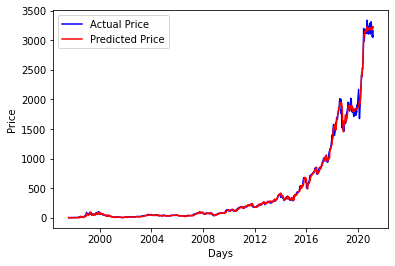

In [15]:
# plot true/pred prices graph
plot_graph(final_df)


In [17]:
print(final_df.tail(10))
# save the final dataframe to csv-results folder
csv_results_folder = "csv-results"
if not os.path.isdir(csv_results_folder):
    os.mkdir(csv_results_folder)
csv_filename = os.path.join(csv_results_folder, model_name + ".csv")
final_df.to_csv(csv_filename)

                   open         high          low        close     adjclose  \
2020-12-15  3181.010010  3188.500000  3130.489990  3165.120117  3165.120117   
2020-12-23  3205.000000  3210.129883  3184.169922  3185.270020  3185.270020   
2020-12-24  3193.899902  3202.000000  3169.000000  3172.689941  3172.689941   
2021-01-12  3120.000000  3142.139893  3086.000000  3120.830078  3120.830078   
2021-01-22  3304.310059  3321.909912  3283.159912  3292.229980  3292.229980   
2021-01-29  3230.000000  3236.989990  3184.550049  3206.199951  3206.199951   
2021-02-17  3263.600098  3320.909912  3259.500000  3308.639893  3308.639893   
2021-03-03  3081.179932  3107.780029  2995.000000  3005.000000  3005.000000   
2021-03-05  3005.000000  3009.000000  2881.000000  3000.459961  3000.459961   
2021-03-11  3104.010010  3131.780029  3082.929932  3113.590088  3113.590088   

             volume ticker  adjclose_15  true_adjclose_15  buy_profit  \
2020-12-15  3323700   AMZN    18.574142         20.270832